In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import optuna
import plotly

In [2]:
path_to_orca = "/home/angelie/Documents/AdaLab/pharmaimage/pharm_env/lib/python3.6/site-packages/panel/pane/plotly.py"
plotly.io.orca.config.executable = path_to_orca

In [15]:
study_name = "2020-10-15-19-43-57_xgb_median_auc_3"

In [16]:
study = optuna.study.load_study(study_name, storage="sqlite:///example.db")
study_sorted = study.trials_dataframe().sort_values('value', ascending=False)

In [17]:
study.best_trial

FrozenTrial(number=23069, value=0.8247873075998076, datetime_start=datetime.datetime(2020, 10, 15, 22, 6, 53, 274431), datetime_complete=datetime.datetime(2020, 10, 15, 22, 6, 56, 85100), params={'fill': 'iterative', 'miss': 0, 'multi_out': 0, 'norm': 'z', 'uni_out_quant': 0.95, 'xgb_lr': 0.039392852580189965, 'xgb_max_depth': 1, 'xgb_num_est': 602, 'yeo': 0}, distributions={'fill': CategoricalDistribution(choices=('median', 'iterative', 'minus')), 'miss': IntUniformDistribution(high=1, low=0, step=1), 'multi_out': IntUniformDistribution(high=1, low=0, step=1), 'norm': CategoricalDistribution(choices=('z', 'minmax')), 'uni_out_quant': CategoricalDistribution(choices=(0.95, 0.999, 0.9999)), 'xgb_lr': UniformDistribution(high=0.1, low=0.001), 'xgb_max_depth': IntUniformDistribution(high=8, low=1, step=1), 'xgb_num_est': IntUniformDistribution(high=1500, low=100, step=1), 'yeo': IntUniformDistribution(high=1, low=0, step=1)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_i

In [ ]:
study_sorted

In [10]:
study.best_params

{'fill': 'iterative',
 'miss': 1,
 'multi_out': 1,
 'norm': 'minmax',
 'uni_out_quant': 0.999,
 'xgb_lr': 0.0036734985160527802,
 'xgb_max_depth': 2,
 'xgb_num_est': 672,
 'yeo': 1}

## Outlier removal

Seems like it doesn't matter which quantile is used for uni outlier removal:

<AxesSubplot:xlabel='params_uni_out_quant'>

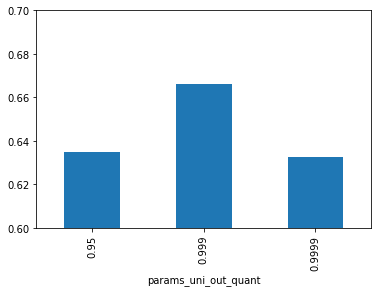

In [11]:
study_sorted.groupby("params_uni_out_quant").mean()["value"].plot.bar(ylim=(0.6, 0.7))

<AxesSubplot:xlabel='params_uni_out_quant'>

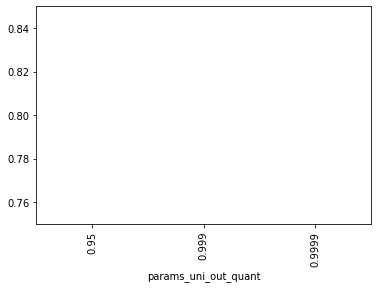

In [12]:
study_sorted.groupby("params_uni_out_quant").mean()["value"].plot.bar(ylim=(0.75, 0.85))

In [16]:
params = ['miss', 'uni_out_quant']
plot = optuna.visualization.plot_contour(study, params=params)
plot.write_image(f"analysis_plots/{params[0]}_{params[1]}.png")

## Distribution

In [16]:
plot = optuna.visualization.plot_contour(study, params=['norm', 'yeo'])
plot.write_image("analysis_plots/norm_yeo.png")

In [ ]:
plot = optuna.visualization.plot_contour(study)
plot.write_image("analysis_plots/contour_all.png")

In [57]:
study_sorted

,number,value,datetime_start,datetime_complete,duration,params_fill,params_miss,params_multi_out,params_norm,params_uni_out_quant,params_xgb_lr,params_xgb_max_depth,params_xgb_num_est,params_yeo,state
23069,23069,0.824787,2020-10-15 22:06:53.274431,2020-10-15 22:06:56.085100,00:00:02.810669,iterative,0,0,z,0.9500,0.039393,1,602,0,COMPLETE
51177,51177,0.824786,2020-10-16 02:39:20.123067,2020-10-16 02:39:24.789642,00:00:04.666575,iterative,0,0,z,0.9500,0.039344,1,611,0,COMPLETE
42801,42801,0.824786,2020-10-16 01:03:45.956627,2020-10-16 01:03:50.093204,00:00:04.136577,iterative,0,0,z,0.9500,0.039415,1,601,0,COMPLETE
50175,50175,0.824786,2020-10-16 02:27:15.465355,2020-10-16 02:27:19.668171,00:00:04.202816,iterative,0,0,z,0.9500,0.039434,1,601,0,COMPLETE
33894,33894,0.824785,2020-10-15 23:35:33.834599,2020-10-15 23:35:37.282191,00:00:03.447592,iterative,0,0,z,0.9500,0.039474,1,605,0,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57529,57529,0.671958,2020-10-16 04:00:29.509218,2020-10-16 04:00:34.840043,00:00:05.330825,iterative,0,0,z,0.9999,0.001105,1,585,0,COMPLETE
18792,18792,0.668662,2020-10-15 21:37:13.160493,2020-10-15 21:37:15.525965,00:00:02.365472,iterative,0,0,minmax,0.9500,0.001167,1,620,0,COMPLETE
63513,63513,0.661926,2020-10-16 05:23:24.111037,2020-10-16 05:23:29.335667,00:00:05.224630,iterative,0,0,z,0.9999,0.001025,1,559,0,COMPLETE
61302,61302,0.661751,2020-10-16 04:51:58.088577,2020-10-16 04:52:03.939217,00:00:05.850640,iterative,0,0,z,0.9500,0.001084,1,525,0,COMPLETE


# Compare studies

In [32]:
study1 = optuna.study.load_study("2020-10-16-15-33-21_rf_median_auc_3", storage="sqlite:///example.db")
study2 = optuna.study.load_study("2020-10-17-17-49-37_rf_median_auc_3", storage="sqlite:///example.db")
study3 = optuna.study.load_study("2020-10-15-16-33-33_rf_median_auc_3", storage="sqlite:///example.db")

In [33]:
plot = optuna.visualization.plot_edf([study1, study2, study3])
plot.write_image("analysis_plots/edf_rf.png")

# Interactive dataframe

In [41]:
!pip install pivottablejs
#https://towardsdatascience.com/interactive-pivot-tables-in-jupyter-notebook-fc74bad8aa67

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3.8 -m pip install --upgrade pip' command.


In [42]:
from pivottablejs import pivot_ui
from IPython.display import HTML

pivot_ui(study_sorted, outfile_path='pivottablejs.html')
HTML('pivottablejs.html')